# __Workshop 4__
## __Trading Algorithmique__

### __Sommaire__

#### __I. Stratégie 1 : Ichimoku Cloud__
   - Calcul des indicateurs
   - Affichage des indicateurs
   - Stratégie
   - Analyse de la stratégie
#### __II. Stratégie 2 : Autoregréssif AR(p)__
   - Introduction
   - Préparation des données
   - Séléction de l'ordre p
   - Création des colonnes de retards
   - Entrainement du modèle
   - Backtesting
   - Analyse de la stratégie

### Importation des librairies

```
pip install yfinance pandas numpy matplotlib ta plotly
```

In [1]:
# import des bibliothèques
import yfinance as yf # permet de récuperer l'historique des cours boursier
import pandas as pd # gestion de data frame 
from datetime import datetime, timedelta
from ta.trend import IchimokuIndicator # Ta-lib (Technical Analysis Library) calcule la plupart des indicateurs techniques
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import numpy as np
import plotly.graph_objects as go
import plotly.express as px

## __Stratégie 1 : Ichimoku Cloud__

### __Calcul des indicateurs__

On note $P_t$ le prix de clôture à la date $t$. Formules pour les calculs des indicateurs :

$$
\begin{align*}
\text{(Tenkan Sen)}_t &= \frac{\text{High}_{t-9:t} + \text{Low}_{t-9:t}}{2} \\
\text{(Kijun Sen)}_t &= \frac{\text{High}_{t-26:t} + \text{Low}_{t-26:t}}{2} \\
\text{(Ichimoku A)}_t &= \frac{\text{(Tenkan Sen)}_t + \text{(Kijun Sen)}_t}{2} \\ 
\text{(Ichimoku B)}_t &= \frac{\text{High}_{t-52:t} + \text{Low}_{t-52:t}}{2} \\
\text{(Ichimoku Max)}_t &= \max(\text{Ichimoku A}_{t}, \text{Ichimoku B}_{t}) \\
\text{(Ichimoku Min)}_t &= \min(\text{Ichimoku A}_{t}, \text{Ichimoku B}_{t})
\end{align*}
$$

In [2]:
# Spécifiez le symbole boursier EUR/USD
symbol = "ATOM-EUR" # Ne pas changer le symbole

# Date de fin
end_date = datetime.now()

# Durée de l'étude (T jours)
T = 50
start_date = end_date - timedelta(days=T)

# Récupérez les données
data = yf.download(symbol, start=start_date, end=end_date, interval="2m")
try:
    data.index = data.index.tz_convert(None)
except:
    print("Impossible de convertir")
# Créez l'indicateur Ichimoku
ichimoku = IchimokuIndicator(high=data["High"], low=data["Low"])

# Ajoutez les colonnes correspondant au nuage Ichimoku à votre DataFrame
data["Ichimoku_A"] = ichimoku.ichimoku_a()
data["Ichimoku_B"] = ichimoku.ichimoku_b()

# Sur le min et le max les conditions logique de sortit du nuage seront plus simple a exprimer
data["Ichimoku_Min"] = data[["Ichimoku_A", "Ichimoku_B"]].min(axis=1)
data["Ichimoku_Max"] = data[["Ichimoku_A", "Ichimoku_B"]].max(axis=1)

[*********************100%%**********************]  1 of 1 completed


### __Affichage des indicateurs__

In [3]:
# Plot avec Plotly
# ------------------------------------
fig = go.Figure(
    data=[
        go.Candlestick(
            x=data.index,
            open=data["Open"],
            high=data["High"],
            low=data["Low"],
            close=data["Close"],
        )
    ]
)

fig.add_trace(
    go.Scatter(
        x=data.index,
        y=data["Ichimoku_A"],
        line=dict(color="blue", width=1),
        name="Ichimoku A",
    )
)
fig.add_trace(
    go.Scatter(
        x=data.index,
        y=data["Ichimoku_B"],
        line=dict(color="red", width=1),
        name="Ichimoku B",
    )
)

last_10_closes = data['Close'].tail(400)

max_close = last_10_closes.max()
min_close = last_10_closes.min()
fig.update_xaxes(rangebreaks=[dict(values=data.index[:-1000])])
fig.update_yaxes(range=[min_close, max_close])
fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()
# ------------------------------------

### __Stratégie__

Dans la suite, on note $P_t$ le prix de clôture à la date $t$. La stratégie est la suivante :

- Si $P_{t-1} < \text{(Ichimoku Max)}_{t-1}$ et $P_t > \text{(Ichimoku Max)}_t$, alors on achète.
- Si $P_{t-1} > \text{(Ichimoku Min)}_{t-1}$ et $P_t < \text{(Ichimoku Min)}_t$, alors on vend.
- Si $P_t < \text{(Ichimoku Max)}_t$ et $P_t > \text{(Ichimoku Min)}_t$, alors on ne fait rien.

On compare notre stratégie avec un investissement passif (ici Buy and Hold).

In [4]:
# solde de départ
S = 100
FEES = 0 # Pour l'instant on ne prend pas en compte les frais de transaction
portfolio_values = []
portfolio_values_buy_and_hold = [100]
nb_transaction = 0
sell = False
buy = False
signals = []

for index, row in data[:-1].iterrows():

    row_next = data.shift(-1).loc[index]
    row_precedent = data.shift(1).loc[index]

    #---------------------VARIABLES-------------------------------
    P_t = row["Close"] # prix de l'actif à l'instant t
    P_t_1 = row_next["Close"] # prix de l'actif à l'instant t+1
    P_t_moins_1 = row_precedent["Close"] # prix de l'actif à l'instant t-1

    ichimoku_max_t_moins_1 = row_precedent["Ichimoku_Max"]
    ichimoku_max_t = row["Ichimoku_Max"]

    ichimoku_min_t_moins_1 = row_precedent["Ichimoku_Min"]
    ichimoku_min_t = row["Ichimoku_Min"]
    #--------------------------------------------------------------

    #-----------------------BUY-----------------------------------
    # On passe en achat lorsqu'on pase au dessus du nuage Ichimoku
    if (
        _____________________ # A COMPLETER
    ):
        buy = True
        nb_transaction += 1
        S -= FEES * S # frais de transaction
    #--------------------------------------------------------------
    #-----------------------SELL-----------------------------------
    # On passe en vente lorsqu'on pase au dessus du nuage Ichimoku
    if (
        _____________________ # A COMPLETER
    ):
        sell = True
        nb_transaction += 1
        S -= FEES * S # frais de transaction
    #--------------------------------------------------------------
    #-----------------------CANCEL---------------------------------
    if buy and ichimoku_max_t > P_t:
        S -= FEES * S
        buy = False

    if sell and ichimoku_min_t < P_t:
        S -= FEES * S
        sell = False
    #--------------------------------------------------------------
    #-----------------------UPDATE---------------------------------
    if sell:
        S -= ______________ # A COMPLETER # S_{t+1} = S_t - (P_{t+1} - P_t) / P_t * S_t
    if buy:
        S +=  ______________ # A COMPLETER  # S_{t+1} = S_t + (P_{t+1} - P_t) / P_t * S_t
    portfolio_values_buy_and_hold.append(portfolio_values_buy_and_hold[-1] + (P_t_1 - P_t) / P_t * portfolio_values_buy_and_hold[-1])
    #--------------------------------------------------------------

    print(f"Date: {index}, Buy: {buy}, Sell: {sell}, S: {S:.2f} €\r", end="")

    portfolio_values.append(S)
    signals.append(1 if buy else -1 if sell else 0)

signals.append(0)
print("\n")
print(f"Nombre de transaction effectué: {nb_transaction}")
print("Valorisation du portefeuille: {:.2f}€".format(S))

# Plot portfolio values using plotly
#------------------------------------
fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index, y=portfolio_values, mode="lines", name="Ichimoku Strategy"))
fig.update_layout(title="Portfolio values", xaxis_title="Date", yaxis_title="Value")
fig.add_trace(go.Scatter(x=data.index, y=portfolio_values_buy_and_hold, mode="lines", name="Buy and Hold"))
fig.show()
#------------------------------------

Date: 2024-02-12 08:28:00, Buy: True, Sell: False, S: 450.86 €€

Nombre de transaction effectué: 1450
Valorisation du portefeuille: 450.86€


En pratique on fait les calculs de manière vectorielle pour accélérer le processus. Pour cela on utilise pandas et numpy.

In [9]:
initial_portfolio_value = 100
FEES = 0 # Pour l'instant on ne prend pas en compte les frais de transaction

data["signal"] = signals
data["portfolio_return"] = data["signal"] * (data["Close"].shift(-1) - data["Close"]) / data["Close"] 
data["portfolio_return"] -= FEES * np.abs(data["signal"].diff())
data["cum_portfolio_return"] = initial_portfolio_value * (1 + data["portfolio_return"]).cumprod()
data["buy_and_hold"] = (
    initial_portfolio_value * (1 + data["Close"].pct_change()).cumprod()
)

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index, y=data["cum_portfolio_return"], mode="lines", name="Strategy"))
fig.add_trace(go.Scatter(x=data.index, y=data["buy_and_hold"], mode="lines", name="Buy and hold"))
fig.update_layout(title="Portfolio values", xaxis_title="Date", yaxis_title="Value")
fig.show()

Maintenant, Relancez le code ci-dessus en rajoutant des fees de 0.1% à chaque transaction.

### __Analyse de la stratégie__

__Quantstats__ est une librairie qui permet de faire des analyses sur les stratégies de trading. On peut par exemple calculer le profit, le drawdown, le nombre de trades, etc. En exécutant le code ci-dessous, on obtient un résumé de la stratégie dans un fichier HTML : ```ichimoku_strategy.html```

In [5]:
# quantstats
import quantstats as qs

qs.extend_pandas()

data = data.dropna()

qs.reports.html(
    returns=data["cum_portfolio_return"],
    benchmark=data["buy_and_hold"],
    output="ichimoku_strategy.html",
    title="Ichimoku Strategy",
)

La stratégie Ichimoku est impressionnante, elle permet très simplement de générer des bénéfices (en théorie) importants. 
De plus, on constate une belle droite, signe d'une variance et donc d'un risque faible, ainsi, on pourrait sans problème envisager d'utiliser l'effet de levier.

Néanmoins, la stratégie Ichimoku donne beaucoup de faux signaux, 1300 transactions en deux mois, c'est énorme et il faudrait au moins faire +130% pour être rentable. 

#### __Question ouverte__ :

Comment réduire le nombre de transactions se débarrassant des faux signaux ?

Pour cela, nous avons essayé :

- élargir le nuage ichimoku (ne réduis pas assez le nombre de transactions. )
- coupler avec d'autres indicateurs comme l'ATR qui donne si le cours suit une tendance clair, ou range. (fait perdre de bonnes opportunités )
- Attendre deux ou trois bougies que ça ressorte vraiment du nuage avant de prendre une position. (en cours de test).
- Implémenter la vraie stratégie Ichimoku, ici, il ne s'agit que d'une version simplifiée.

#### __Appendice:__
##### __Calcul du nouveau solde:__ 

Pour le calcul du solde suivant en supposant que l'on mise tout le solde à chaque fois, avec $S_n$ le solde à l'instant n et $P_n$ le prix de l'indice à l'instant n, on a: 


Pour un achat : 

$S^{achat}_{n+1}=S_{n}-S_{n}+N_{action}P_{n+1}$ et $N_{action}=\frac{S_n}{P_n}$ le nombre action acheter avec $S_n$ à l'instant n.

D'où: $S_{n+1}=S_n\frac{P_{n+1}}{P_n}$

Pour une vente on utilise le fait qu'acheter et vendre un indice reviens à ne rien faire, soit:

$S^{achat}_{n+1}+S^{vente}_{n+1}= 2S_{n}$

D'où $S^{vente}_{n+1}=S_{n}(2-\frac{P_{n+1}}{P_{n}})$

## __Stratégie 2 : Autoregréssif AR(p)__

### __Introduction__

Un modèle autorégressif d'ordre $p$, noté AR(p), est utilisé pour modéliser des séries temporelles. Dans ce modèle, la valeur actuelle de la série est déterminée par ses $p$ valeurs précédentes et un terme d'erreur.

-----
#### __Forme de Base du Modèle AR(p)__
La forme générale d'un modèle AR(p) est :

$$
X_t = c + \phi_1 X_{t-1} + \phi_2 X_{t-2} + \ldots + \phi_p X_{t-p} + \epsilon_t
$$

- $X_t$ : valeur actuelle de la série
- $c$ : constante
- $\phi_1, \phi_2, \ldots, \phi_p$ : paramètres du modèle
- $\epsilon_t$ : terme d'erreur

Il est important de noter que le modèle AR fonctionne uniquement avec des séries temporelles stationnaires. Pour cela, $X_t$ ne peut pas être le prix de clôture mais plutôt le rendement de la série.

#### __Calcul des Log-Returns__

Le rendement d'une série temporelle est calculé comme suit :

$$
X_t = \text{Log-Return}_t = \log\left(\frac{P_t}{P_{t-1}}\right)
$$

En python cela donne:

```python
data['log_returns'] = np.log(data['Close']/data['Close'].shift(1))
data.dropna(inplace=True)
```

#### __Train-Test Split__

Un principe fondamental en apprentissage automatique est de diviser les données en un ensemble d'entraînement et un ensemble de test. L'ensemble d'entraînement est utilisé pour entraîner le modèle tandis que l'ensemble de test est utilisé pour évaluer ses performances.

En python cela donne:

```python
train_size = 0.7
data_train = data.copy().iloc[:int(len(data)*train_size)]
data_test = data.copy().iloc[int(len(data)*train_size):]
```

### __Préparation des données__

In [58]:
# Spécifiez le symbole boursier EUR/USD
symbol = "ATOM-EUR" # Ne pas changer le symbole

# Date de fin
end_date = datetime.now()

# Durée de l'étude (T jours)
T = 50
start_date = end_date - timedelta(days=T)

# Récupérez les données
data = yf.download(symbol, start=start_date, end=end_date, interval="5m")
data.index = data.index.tz_convert(None)

# Log returns
data["log_return"] = np.log(data["Close"] / data["Close"].shift(1))

# Split des données
train_size = 0.7
data_train = data.copy().iloc[: int(train_size * len(data))]
data_test = data.copy().iloc[int(train_size * len(data)) :]

[*********************100%%**********************]  1 of 1 completed


### __Selection de l'Ordre du Modèle__

Pour choisir l'ordre du modèle AR(p), on utilise la fonction ```plot_pacf``` de la librairie ```statsmodels```. Cette fonction trace le PACF (Partial Autocorrelation Function) de la série temporelle. Le PACF mesure la corrélation entre la série et ses valeurs décalées. En général, on choisit l'ordre $p$ du modèle AR(p) en regardant le nombre de retards significatifs c'est-à-dire ceux qui sortent de l'intervalle de confiance.

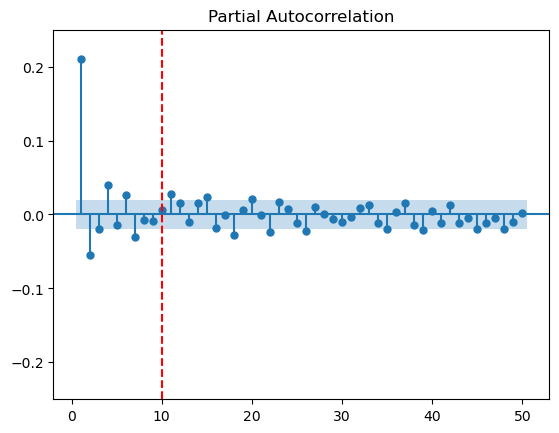

In [59]:
# plot pacf
from statsmodels.graphics.tsaplots import plot_pacf
fig, ax = plt.subplots()

plot_pacf(data_train["log_return"].dropna(), ax=ax, method='ywm', lags=50, zero=False)
# add vertical line at 10
ax.axvline(x=10, color='r', linestyle='--')
ax.set_ylim(-0.25, 0.25)

plt.show()

On va prendre l'ordre $p = 10$ pour notre modèle AR(p).

### __Création des colonnes de retards__

In [60]:
p = 10 # On prend 10 comme ordre du modèle AR
lags = list(range(1, p))

for lag in lags:
    data_train[f'log_return_lag{lag}'] = data_train['log_return'].shift(lag)
    data_test[f'log_return_lag{lag}'] = data_test['log_return'].shift(lag)

data_train.dropna(inplace=True)
data_test.dropna(inplace=True)

On peut afficher la matrice de corrélation pour voir si les retards sont significatifs.

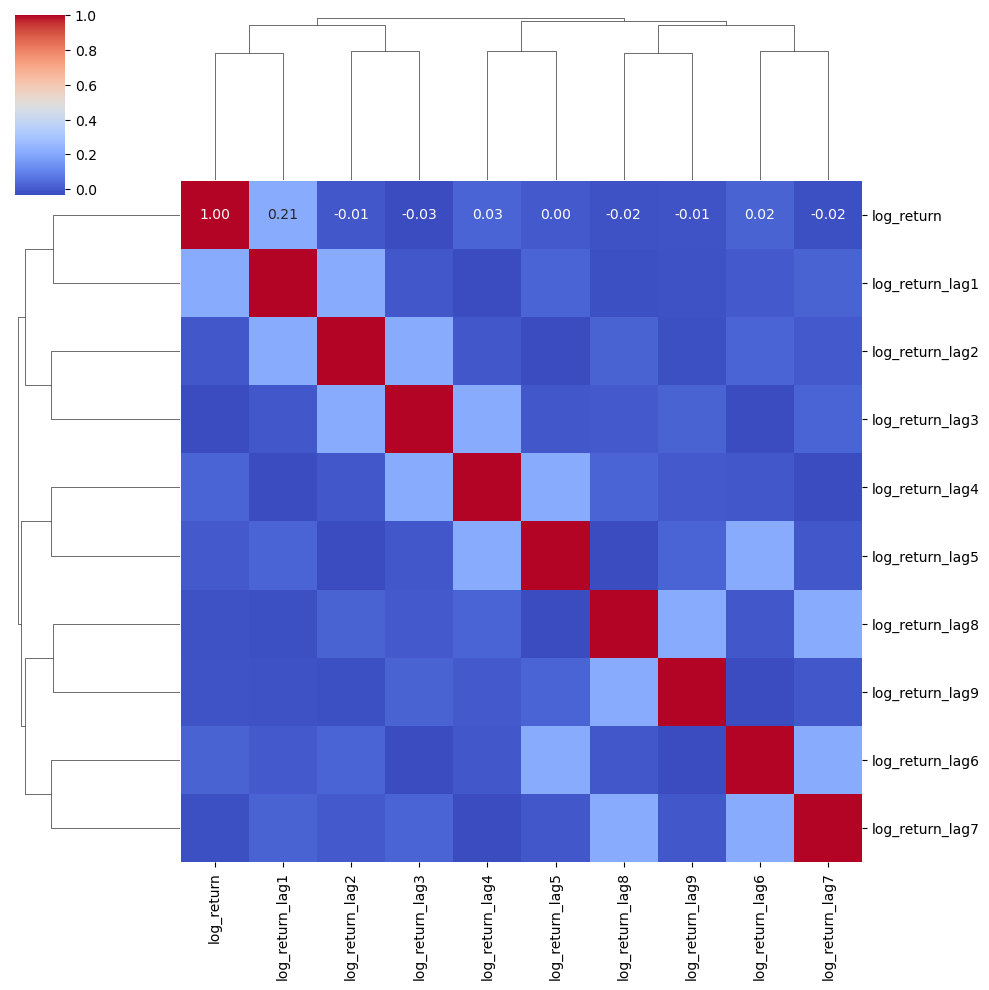

In [61]:
# correlation matrix
import seaborn as sns
sns.clustermap(data_train[[c for c in data_train.columns if 'return' in c]].corr(), annot=True, fmt=".2f", cmap="coolwarm")

### __Entraînement du Modèle__

Dans cette partie, on va entraîner le modèle AR(p) sur l'ensemble d'entraînement. Pour cela on va utiliser la méthode des moindres carrés ordinaires (OLS) pour estimer les paramètres du modèle. 

Vous verrez la théorie derrière la méthode OLS dans les cours de __SD__ ou __TSIA__

In [62]:
from statsmodels.api import OLS, add_constant
Y = data_train['log_return']
X = add_constant(data_train[[c for c in data_train.columns if 'lag' in c]])

phis = np.linalg.lstsq(X, Y, rcond=None)[0]

# plot des coefficients avec plotly bar
#------------------------------------
fig = go.Figure()
fig.add_trace(go.Bar(x=X.columns, y=phis))
fig.update_layout(title="Coefficients", xaxis_title="Lags", yaxis_title="Value")
fig.show()

In [63]:
model = OLS(endog=Y, exog=X)
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             log_return   R-squared:                       0.051
Model:                            OLS   Adj. R-squared:                  0.050
Method:                 Least Squares   F-statistic:                     59.60
Date:                Mon, 12 Feb 2024   Prob (F-statistic):          7.90e-107
Time:                        09:16:14   Log-Likelihood:                 47634.
No. Observations:               10031   AIC:                        -9.525e+04
Df Residuals:                   10021   BIC:                        -9.518e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -1.483e-05   2.09e-05     -0.708      0.479   -5.59e-05    2.62e-05
log_return_lag1     0.2227      0.010     22.291      0.000       0.203       0.242
log_return_lag2    -0.0500      0.010     -4.889      0.000      -0.070      -0.030
log_return_lag3    -0.0275      0.010     -2.686      0.007      -0.048      -0.007
log_return_lag4     0.0442      0.010      4.312      0.000       0.024       0.064
log_return_lag5    -0.0211      0.010     -2.057      0.040      -0.041      -0.001
log_return_lag6     0.0329      0.010      3.209      0.001       0.013       0.053
log_return_lag7    -0.0297      0.010     -2.899      0.004      -0.050      -0.010
log_return_lag8    -0.0060      0.010     -0.584      0.559      -0.026       0.014
log_return_lag9    -0.0084      0.010     -0.838      0.402      -0.028       0.011
==============================================================================
Omnibus:                    13198.486   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         25576704.191
Skew:                          -6.527   Prob(JB):                         0.00
Kurtosis:                     250.030   Cond. No.                         598.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### __Backtesting de la Stratégie__

La stratégie de trading est la suivante :

- Si $\hat{X}_t > high$ alors on achète.
- Si $\hat{X}_t < low$ alors on vend.

Ici, $\hat{X}_t$ est la prédiction du modèle AR(p) à la date $t$. $high$ et $low$ sont les bornes supérieures et inférieures de l'intervalle de confiance.

In [64]:
data_train['pred'] = X @ phis

low = data_train['pred'].quantile(0.2)
high = data_train['pred'].quantile(0.8)

data_test['pred'] = add_constant(data_test[[c for c in data_test.columns if 'lag' in c]]) @ phis

data_test['signal'] = np.where(data_test['pred'] > high, 1, 0)
data_test['signal'] = np.where(data_test['pred'] < low, -1, data_test['signal'])

FEES = 0
initial_portfolio_value = 100

data_test["portfolio_return"] = data_test["signal"] * (data_test["Close"] - data_test["Close"].shift(1)) / data_test["Close"] 
data_test["portfolio_return"] -= FEES * np.abs(data_test["signal"].diff())
data_test["cum_portfolio_return"] = initial_portfolio_value * (1 + data_test["portfolio_return"]).cumprod()
data_test["buy_and_hold"] = (
    initial_portfolio_value * (1 + data_test["Close"].pct_change()).cumprod()
)

nombre_de_transaction = int((np.sum(np.abs(data_test['signal'].diff()))))

print(f"Nombre de transactions {nombre_de_transaction}")

fig = go.Figure()
fig.add_trace(go.Scatter(x=data_test.index, y=data_test["cum_portfolio_return"], mode="lines", name="Strategy"))
fig.add_trace(go.Scatter(x=data_test.index, y=data_test["buy_and_hold"], mode="lines", name="Buy and hold"))
fig.update_layout(title="Portfolio values", xaxis_title="Date", yaxis_title="Value")
fig.show()

Nombre de transactions 1626


### __Analyse de la Stratégie__

In [62]:
# quantstats
import quantstats as qs

qs.extend_pandas()

data_test = data_test.dropna()

qs.reports.html(
    returns=data_test["cum_portfolio_return"],
    benchmark=data_test["buy_and_hold"],
    output="ar_strategy.html",
    title="AR(p) Strategy",
)